<a href="https://colab.research.google.com/github/flaviohnm/recomendation_system/blob/main/recomendation_system.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Dicas:

1. O que quer recomendar?
2. Alinhe com o gestor de produtos/comercial
3. Teste !!!


In [1]:
# Frameworks

# Modelagem de Dados
import pandas as pd  # Dados
import numpy as np  # Matrizes

# Analises Gráficas
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

# Avisos
import warnings
warnings.filterwarnings('ignore')

# Ajustes no pandas
pd.set_option('display.max_rows', 100)  # Linhas
pd.set_option('display.max_columns', 50)  # Colunas

# Ajustes no matplot
plt.rcParams['figure.figsize'] = (15, 6)  # Tamanho do Gráfico
plt.style.use('seaborn-v0_8-darkgrid')  # Estilo do Gráfico

# **Importação dos Dados**


In [2]:
# Ler os dados
Dados_Livros = pd.read_csv('./data/Books.csv')
Dados_Avaliacao = pd.read_csv('./data/Ratings.csv')
Dados_Usuario = pd.read_csv('./data/Users.csv')

Dados_Livros.shape, Dados_Avaliacao.shape, Dados_Usuario.shape

((271360, 8), (1149780, 3), (278858, 3))

In [3]:
# Primeiras Linhas
Dados_Livros.head()

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,Image-URL-S,Image-URL-M,Image-URL-L
0,0195153448,Classical Mythology,Mark P. O. Morford,2002,Oxford University Press,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...
1,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...
2,0060973129,Decision in Normandy,Carlo D'Este,1991,HarperPerennial,http://images.amazon.com/images/P/0060973129.0...,http://images.amazon.com/images/P/0060973129.0...,http://images.amazon.com/images/P/0060973129.0...
3,0374157065,Flu: The Story of the Great Influenza Pandemic...,Gina Bari Kolata,1999,Farrar Straus Giroux,http://images.amazon.com/images/P/0374157065.0...,http://images.amazon.com/images/P/0374157065.0...,http://images.amazon.com/images/P/0374157065.0...
4,0393045218,The Mummies of Urumchi,E. J. W. Barber,1999,W. W. Norton &amp; Company,http://images.amazon.com/images/P/0393045218.0...,http://images.amazon.com/images/P/0393045218.0...,http://images.amazon.com/images/P/0393045218.0...


In [4]:
Dados_Livros.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 271360 entries, 0 to 271359
Data columns (total 8 columns):
 #   Column               Non-Null Count   Dtype 
---  ------               --------------   ----- 
 0   ISBN                 271360 non-null  object
 1   Book-Title           271360 non-null  object
 2   Book-Author          271358 non-null  object
 3   Year-Of-Publication  271360 non-null  object
 4   Publisher            271358 non-null  object
 5   Image-URL-S          271360 non-null  object
 6   Image-URL-M          271360 non-null  object
 7   Image-URL-L          271357 non-null  object
dtypes: object(8)
memory usage: 16.6+ MB


In [5]:
# Verificando
Dados_Avaliacao.head()  # Avaliacao de 0 até 10

,User-ID,ISBN,Book-Rating
0,276725,034545104X,0
1,276726,0155061224,5
2,276727,0446520802,0
3,276729,052165615X,3
4,276729,0521795028,6


In [6]:
# Info
Dados_Avaliacao.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1149780 entries, 0 to 1149779
Data columns (total 3 columns):
 #   Column       Non-Null Count    Dtype 
---  ------       --------------    ----- 
 0   User-ID      1149780 non-null  int64 
 1   ISBN         1149780 non-null  object
 2   Book-Rating  1149780 non-null  int64 
dtypes: int64(2), object(1)
memory usage: 26.3+ MB


In [7]:
# Verificando
Dados_Usuario.head()

,User-ID,Location,Age
0,1,"nyc, new york, usa",NaN
1,2,"stockton, california, usa",18.0
2,3,"moscow, yukon territory, russia",NaN
3,4,"porto, v.n.gaia, portugal",17.0
4,5,"farnborough, hants, united kingdom",NaN


In [8]:
# Info
Dados_Usuario.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 278858 entries, 0 to 278857
Data columns (total 3 columns):
 #   Column    Non-Null Count   Dtype  
---  ------    --------------   -----  
 0   User-ID   278858 non-null  int64  
 1   Location  278858 non-null  object 
 2   Age       168096 non-null  float64
dtypes: float64(1), int64(1), object(1)
memory usage: 6.4+ MB


# **Modelagem dos Dados**


In [9]:
# Cruzamento dos dados

# 1º Cruzamento
Tab_Cruzada = Dados_Livros.merge(Dados_Avaliacao, how='inner', on='ISBN')

# 2º Cruzamento
Tab_Cruzada = Tab_Cruzada.merge(Dados_Usuario, how='inner', on='User-ID')

# Dimensão
Tab_Cruzada.shape

(1031136, 12)

In [10]:
# Verificando
Tab_Cruzada.head()

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,Image-URL-S,Image-URL-M,Image-URL-L,User-ID,Book-Rating,Location,Age
0,0195153448,Classical Mythology,Mark P. O. Morford,2002,Oxford University Press,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...,2,0,"stockton, california, usa",18.0
1,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,8,5,"timmins, ontario, canada",NaN
2,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,11400,0,"ottawa, ontario, canada",49.0
3,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,11676,8,"n/a, n/a, n/a",NaN
4,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,41385,0,"sudbury, ontario, canada",NaN


In [11]:
# Verificar
Tab_Cruzada.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1031136 entries, 0 to 1031135
Data columns (total 12 columns):
 #   Column               Non-Null Count    Dtype  
---  ------               --------------    -----  
 0   ISBN                 1031136 non-null  object 
 1   Book-Title           1031136 non-null  object 
 2   Book-Author          1031134 non-null  object 
 3   Year-Of-Publication  1031136 non-null  object 
 4   Publisher            1031134 non-null  object 
 5   Image-URL-S          1031136 non-null  object 
 6   Image-URL-M          1031136 non-null  object 
 7   Image-URL-L          1031132 non-null  object 
 8   User-ID              1031136 non-null  int64  
 9   Book-Rating          1031136 non-null  int64  
 10  Location             1031136 non-null  object 
 11  Age                  753301 non-null   float64
dtypes: float64(1), int64(2), object(9)
memory usage: 94.4+ MB


In [12]:
# Ajustando o resgistro incorreto
Tab_Cruzada.iloc[959681, 3] = ''
Tab_Cruzada.iloc[959682, 3] = ''
Tab_Cruzada.iloc[974669, 3] = ''
Tab_Cruzada.iloc[975881, 3] = ''

# Converter a coluna Ano
Tab_Cruzada['Year-Of-Publication'] = pd.to_numeric(
    Tab_Cruzada['Year-Of-Publication'])

In [13]:
# Formato das Colunas
Tab_Cruzada.dtypes

,0
ISBN,object
Book-Title,object
Book-Author,object
Year-Of-Publication,float64
Publisher,object
Image-URL-S,object
Image-URL-M,object
Image-URL-L,object
User-ID,int64
Book-Rating,int64


In [14]:
# Verificando
Tab_Cruzada['Location'].head(5)

,Location
0,"stockton, california, usa"
1,"timmins, ontario, canada"
2,"ottawa, ontario, canada"
3,"n/a, n/a, n/a"
4,"sudbury, ontario, canada"


In [15]:
# Verificando
Tab_Cruzada['Location'].tail(5)

,Location
1031131,"providence, rhode island, usa"
1031132,"orem, utah, usa"
1031133,"hopewell junction, new york, usa"
1031134,"hopewell junction, new york, usa"
1031135,"hopewell junction, new york, usa"


In [16]:
# Tecnica de Tratamento de Texto

def Extrair_Pais(Regiao):
    '''
        Função para extrair o nome do pais na coluna região
    '''

    # Incluindo a informação
    Registro = Regiao

    # Fatiar
    Registro = Regiao.split(',')

    # Buscar
    Fracao = Registro[-1].upper()

    # Retorno
    return Fracao


# Criando a coluna
Tab_Cruzada['Pais'] = Tab_Cruzada['Location'].apply(Extrair_Pais)

# Verificando
Tab_Cruzada.head()

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,Image-URL-S,Image-URL-M,Image-URL-L,User-ID,Book-Rating,Location,Age,Pais
0,0195153448,Classical Mythology,Mark P. O. Morford,2002.0,Oxford University Press,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...,2,0,"stockton, california, usa",18.0,USA
1,0002005018,Clara Callan,Richard Bruce Wright,2001.0,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,8,5,"timmins, ontario, canada",NaN,CANADA
2,0002005018,Clara Callan,Richard Bruce Wright,2001.0,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,11400,0,"ottawa, ontario, canada",49.0,CANADA
3,0002005018,Clara Callan,Richard Bruce Wright,2001.0,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,11676,8,"n/a, n/a, n/a",NaN,N/A
4,0002005018,Clara Callan,Richard Bruce Wright,2001.0,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,41385,0,"sudbury, ontario, canada",NaN,CANADA


In [17]:
Tab_Cruzada.isnull().sum()

,0
ISBN,0
Book-Title,0
Book-Author,2
Year-Of-Publication,4
Publisher,2
Image-URL-S,0
Image-URL-M,0
Image-URL-L,4
User-ID,0
Book-Rating,0


In [18]:
# Unicos
Tab_Cruzada.nunique()

,0
ISBN,270151
Book-Title,241071
Book-Author,101587
Year-Of-Publication,116
Publisher,16729
Image-URL-S,269842
Image-URL-M,269842
Image-URL-L,269839
User-ID,92106
Book-Rating,11


In [19]:
# Renomear as Colunas
Tab_Cruzada.rename(
    columns={
        'Book-Title': 'Titulo',
        'Book-Author': 'Autor',
        'Year-Of-Publication': 'Ano-Publicacao',
        'Publisher': 'Editora',
        'User-ID': 'Id-Cliente',
        'Book-Rating': 'Avaliacao',
        'Location': 'Localizacao',
        'Age': 'Idade'
    }, inplace=True
)

# Verificar
Tab_Cruzada.columns

Index(['ISBN', 'Titulo', 'Autor', 'Ano-Publicacao', 'Editora', 'Image-URL-S',
       'Image-URL-M', 'Image-URL-L', 'Id-Cliente', 'Avaliacao', 'Localizacao',
       'Idade', 'Pais'],
      dtype='object')

# **Data Visualization - Exploração**


In [20]:
# Analise Descritiva
Tab_Cruzada.describe()

,Ano-Publicacao,Id-Cliente,Avaliacao,Idade
count,1.031132e+06,1.031136e+06,1.031136e+06,753301.000000
mean,1.968195e+03,1.405945e+05,2.839051e+00,37.397648
std,2.311015e+02,8.052466e+04,3.854157e+00,14.098254
min,0.000000e+00,2.000000e+00,0.000000e+00,0.000000
25%,1.992000e+03,7.041500e+04,0.000000e+00,28.000000
50%,1.997000e+03,1.412100e+05,0.000000e+00,35.000000
75%,2.001000e+03,2.114260e+05,7.000000e+00,45.000000
max,2.050000e+03,2.788540e+05,1.000000e+01,244.000000


In [21]:
Tab_Cruzada.head(20)

,ISBN,Titulo,Autor,Ano-Publicacao,Editora,Image-URL-S,Image-URL-M,Image-URL-L,Id-Cliente,Avaliacao,Localizacao,Idade,Pais
0,0195153448,Classical Mythology,Mark P. O. Morford,2002.0,Oxford University Press,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...,2,0,"stockton, california, usa",18.0,USA
1,0002005018,Clara Callan,Richard Bruce Wright,2001.0,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,8,5,"timmins, ontario, canada",NaN,CANADA
2,0002005018,Clara Callan,Richard Bruce Wright,2001.0,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,11400,0,"ottawa, ontario, canada",49.0,CANADA
3,0002005018,Clara Callan,Richard Bruce Wright,2001.0,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,11676,8,"n/a, n/a, n/a",NaN,N/A
4,0002005018,Clara Callan,Richard Bruce Wright,2001.0,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,41385,0,"sudbury, ontario, canada",NaN,CANADA
5,0002005018,Clara Callan,Richard Bruce Wright,2001.0,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,67544,8,"toronto, ontario, canada",30.0,CANADA
6,0002005018,Clara Callan,Richard Bruce Wright,2001.0,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,85526,0,"victoria, british columbia, canada",36.0,CANADA
7,0002005018,Clara Callan,Richard Bruce Wright,2001.0,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,96054,0,"ottawa, ontario, canada",29.0,CANADA
8,0002005018,Clara Callan,Richard Bruce Wright,2001.0,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,116866,9,"ottawa, ,",NaN,
9,0002005018,Clara Callan,Richard Bruce Wright,2001.0,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,123629,9,"kingston, ontario, canada",NaN,CANADA


In [22]:
# Remover as Avaliações Zeradas
Tab_Cruzada = Tab_Cruzada.loc[Tab_Cruzada['Avaliacao'] > 0]

# Verificar
Tab_Cruzada.isnull().sum(), Tab_Cruzada.shape

(ISBN                   0
 Titulo                 0
 Autor                  2
 Ano-Publicacao         1
 Editora                2
 Image-URL-S            0
 Image-URL-M            0
 Image-URL-L            1
 Id-Cliente             0
 Avaliacao              0
 Localizacao            0
 Idade             114221
 Pais                   0
 dtype: int64,
 (383842, 13))

In [23]:
# Verificar
Tab_Cruzada['Avaliacao'].describe()

,Avaliacao
count,383842.000000
mean,7.626701
std,1.841339
min,1.000000
25%,7.000000
50%,8.000000
75%,9.000000
max,10.000000


<Axes: title={'center': 'Analisando a Avaliação'}, xlabel='Avaliacao'>

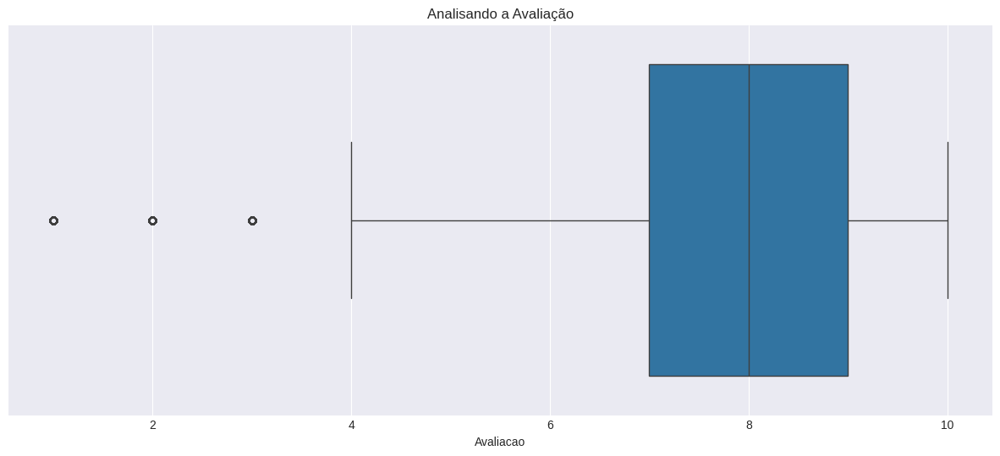

In [24]:
# Analise Gráfica
plt.title('Analisando a Avaliação')
sns.boxplot(data=Tab_Cruzada, x='Avaliacao')

In [25]:
# Analise
Analise = Tab_Cruzada.groupby(by=['Titulo']).agg(
    Quantidade=('Titulo', 'count'),
    Media=('Avaliacao', 'mean'),
    Max=('Avaliacao', 'max'),
    Min=('Avaliacao', 'min'),
    Mediana=('Avaliacao', 'median'),
)

# Verificando

Analise.head()

,Quantidade,Media,Max,Min,Mediana
Titulo,,,,,
"A Light in the Storm: The Civil War Diary of Amelia Martin, Fenwick Island, Delaware, 1861 (Dear America)",1,9.000000,9,9,9.0
"Ask Lily (Young Women of Faith: Lily Series, Book 5)",1,8.000000,8,8,8.0
Dark Justice,1,10.000000,10,10,10.0
"Earth Prayers From around the World: 365 Prayers, Poems, and Invocations for Honoring the Earth",7,7.142857,10,1,7.0
Final Fantasy Anthology: Official Strategy Guide (Brady Games),2,10.000000,10,10,10.0


In [26]:
# Verificar
Analise.sort_values('Quantidade', ascending=False).head()

,Quantidade,Media,Max,Min,Mediana
Titulo,,,,,
The Lovely Bones: A Novel,707,8.185290,10,1,8.0
Wild Animus,581,4.390706,10,1,4.0
The Da Vinci Code,494,8.439271,10,1,9.0
The Secret Life of Bees,406,8.477833,10,2,9.0
The Nanny Diaries: A Novel,393,7.437659,10,1,8.0


In [27]:
# Verificar
Analise.sort_values(['Media', 'Quantidade'], ascending=False).head()

,Quantidade,Media,Max,Min,Mediana
Titulo,,,,,
Postmarked Yesteryear: 30 Rare Holiday Postcards,11,10.0,10,10,10.0
The Sneetches and Other Stories,8,10.0,10,10,10.0
Natural California: A Postcard Book,7,10.0,10,10,10.0
Uncle John's Supremely Satisfying Bathroom Reader (Uncle John's Bathroom Reader),7,10.0,10,10,10.0
"Oh, the Thinks You Can Think! (I Can Read It All by Myself Beginner Books)",6,10.0,10,10,10.0


In [28]:
# Analise Qtd X Avaliacao

px.scatter(
    # Dados
    data_frame=Analise,
    # Parametros
    x='Quantidade', y='Media',
    # Titulo
    title='Média X Quantidade - Titulos',
    # Upgrade
    marginal_y='rug', marginal_x='histogram'
)

In [29]:
# Correlação
Analise.corr()

,Quantidade,Media,Max,Min,Mediana
Quantidade,1.000000,0.018880,0.175572,-0.251497,0.036604
Media,0.018880,1.000000,0.889722,0.842385,0.989839
Max,0.175572,0.889722,1.000000,0.530760,0.887792
Min,-0.251497,0.842385,0.530760,1.000000,0.804023
Mediana,0.036604,0.989839,0.887792,0.804023,1.000000


In [30]:
Analise['Quantidade'].describe()

,Quantidade
count,135567.000000
mean,2.831382
std,9.135691
min,1.000000
25%,1.000000
50%,1.000000
75%,2.000000
max,707.000000


In [31]:
#

def Classificacao_Quantidade(Quantidade):
    '''
        Agrupar a quantidade
    '''

    if int(Quantidade) <= 5:
        return '1-5 Avaliações'
    elif int(Quantidade) <= 10:
        return '6-10 Avaliações'
    elif int(Quantidade) <= 50:
        return '11-50 Avaliações'
    elif int(Quantidade) <= 100:
        return '51-100 Avaliações'
    else:
        return '>101 Avaliações'


# Aplicação
Pizza = Analise['Quantidade'].apply(
    Classificacao_Quantidade).value_counts(normalize=True)

# Transformação
Pizza = pd.DataFrame(Pizza).reset_index()

# Plot
px.pie(
    # Dados
    data_frame=Pizza,
    # Parametros
    names='Quantidade', values='proportion',
    # Titulo
    title='Divisão das Quantidades'
)

In [32]:
print(Pizza)

          Quantidade  proportion
0     1-5 Avaliações    0.920010
1    6-10 Avaliações    0.042783
2   11-50 Avaliações    0.032589
3  51-100 Avaliações    0.003201
4    >101 Avaliações    0.001416


In [33]:
# Publicação
Analise_Ano = Tab_Cruzada['Ano-Publicacao'].value_counts().sort_index().reset_index()
# Analise_Ano.reset_index()
Analise_Ano.head()

,Ano-Publicacao,count
0,0.0,5783
1,1376.0,1
2,1378.0,1
3,1806.0,1
4,1900.0,1


In [34]:
Analise_Ano.describe()

,Ano-Publicacao,count
count,105.000000,105.000000
mean,1934.028571,3655.628571
std,210.090432,8051.797181
min,0.000000,1.000000
25%,1937.000000,4.000000
50%,1963.000000,63.000000
75%,1989.000000,1652.000000
max,2050.000000,37986.000000


<BarContainer object of 18 artists>

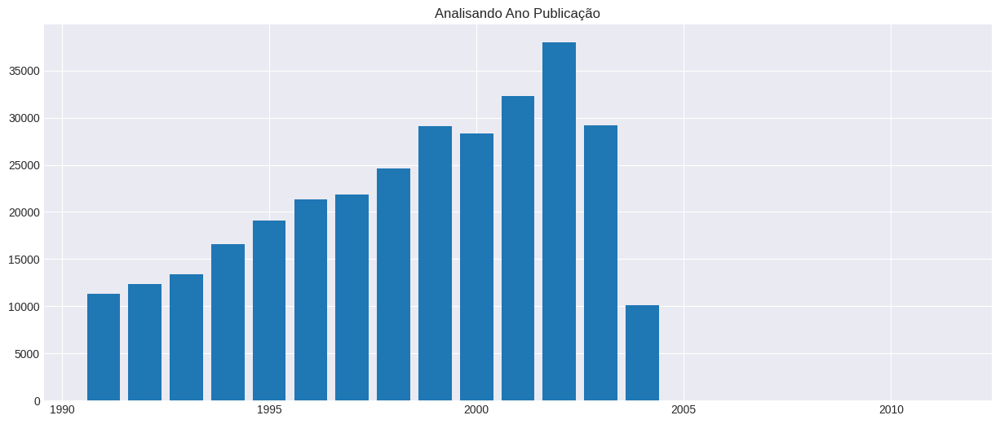

In [35]:
# Plot
Filtro = Analise_Ano.loc[
    (Analise_Ano["Ano-Publicacao"] >
     1990) & (Analise_Ano["Ano-Publicacao"] < 2020)
]

plt.title("Analisando Ano Publicação")
plt.bar(Filtro["Ano-Publicacao"], Filtro["count"])

In [36]:
# Autores
Tab_Cruzada.groupby(
    by='Autor'
).agg(
    Quantidade=('Avaliacao', 'count'),
    Media=('Avaliacao', 'mean')
).sort_values('Quantidade', ascending=False).head(10)

,Quantidade,Media
Autor,,
Stephen King,4639,7.815046
Nora Roberts,2938,7.629680
John Grisham,2550,7.523137
James Patterson,2387,7.697947
J. K. Rowling,1746,8.970218
Mary Higgins Clark,1677,7.503280
Janet Evanovich,1490,7.944966
Dean R. Koontz,1475,7.572203
Anne Rice,1245,7.387952


In [37]:
# Região
Tab_Cruzada['Pais'].value_counts(normalize=True)*100

,proportion
Pais,
USA,68.378135
CANADA,9.267876
UNITED KINGDOM,3.854190
GERMANY,3.165625
,2.737845
...,...
ORANGE CO,0.000261
ST. HELENA,0.000261
"HUNGARY""",0.000261


In [38]:
# Região
Tab_Cruzada['Pais'].value_counts(normalize=True).cumsum().head(10)*100

,proportion
Pais,
USA,68.378135
CANADA,77.646011
UNITED KINGDOM,81.500201
GERMANY,84.665826
,87.403671
SPAIN,89.278662
AUSTRALIA,91.099984
N/A,92.911927
FRANCE,94.119716


<Axes: xlabel='Idade'>

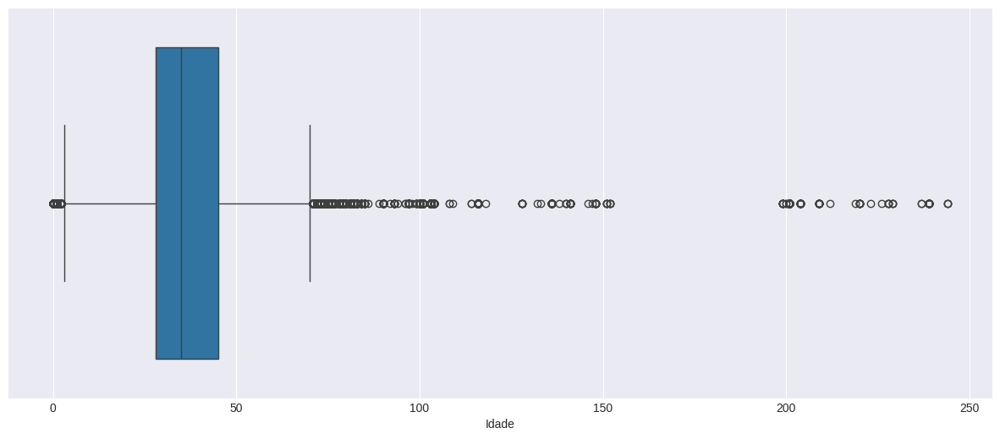

In [39]:
# Idade
plt.title = ('Análise das Idades')
sns.boxplot(data=Tab_Cruzada, x='Idade')

# **Construção do Modelo**


In [40]:
# Ajustar (Avaliação dos Livros --> Tab_Cruzada)

# Ajustando a Tabela de Avaliações
Avaliacaoes = Analise.reset_index().iloc[:, 0:2]

# Cruzando os dados
Tab_Final = Tab_Cruzada.merge(Avaliacaoes, how='inner', on='Titulo')

# Verificando
Tab_Final.head()

,ISBN,Titulo,Autor,Ano-Publicacao,Editora,Image-URL-S,Image-URL-M,Image-URL-L,Id-Cliente,Avaliacao,Localizacao,Idade,Pais,Quantidade
0,0002005018,Clara Callan,Richard Bruce Wright,2001.0,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,8,5,"timmins, ontario, canada",NaN,CANADA,9
1,0002005018,Clara Callan,Richard Bruce Wright,2001.0,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,11676,8,"n/a, n/a, n/a",NaN,N/A,9
2,0002005018,Clara Callan,Richard Bruce Wright,2001.0,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,67544,8,"toronto, ontario, canada",30.0,CANADA,9
3,0002005018,Clara Callan,Richard Bruce Wright,2001.0,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,116866,9,"ottawa, ,",NaN,,9
4,0002005018,Clara Callan,Richard Bruce Wright,2001.0,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,123629,9,"kingston, ontario, canada",NaN,CANADA,9


In [41]:
# Filtrar
Livros_Avaliados = Tab_Final.loc[Tab_Final['Quantidade'] >= 50]

# Dimensão
Livros_Avaliados.shape

(65477, 14)

In [42]:
# Duplicados
Livros_Avaliados.duplicated().sum()

0

In [43]:
Livros_Avaliados.head()

,ISBN,Titulo,Autor,Ano-Publicacao,Editora,Image-URL-S,Image-URL-M,Image-URL-L,Id-Cliente,Avaliacao,Localizacao,Idade,Pais,Quantidade
17,0399135782,The Kitchen God's Wife,Amy Tan,1991.0,Putnam Pub Group,http://images.amazon.com/images/P/0399135782.0...,http://images.amazon.com/images/P/0399135782.0...,http://images.amazon.com/images/P/0399135782.0...,11676,9,"n/a, n/a, n/a",NaN,N/A,116
18,0399135782,The Kitchen God's Wife,Amy Tan,1991.0,Putnam Pub Group,http://images.amazon.com/images/P/0399135782.0...,http://images.amazon.com/images/P/0399135782.0...,http://images.amazon.com/images/P/0399135782.0...,29526,9,"knoxville, tennessee, usa",26.0,USA,116
19,0399135782,The Kitchen God's Wife,Amy Tan,1991.0,Putnam Pub Group,http://images.amazon.com/images/P/0399135782.0...,http://images.amazon.com/images/P/0399135782.0...,http://images.amazon.com/images/P/0399135782.0...,46398,9,"san antonio, texas, usa",37.0,USA,116
20,0399135782,The Kitchen God's Wife,Amy Tan,1991.0,Putnam Pub Group,http://images.amazon.com/images/P/0399135782.0...,http://images.amazon.com/images/P/0399135782.0...,http://images.amazon.com/images/P/0399135782.0...,49635,9,"seattle, washington, usa",NaN,USA,116
21,0399135782,The Kitchen God's Wife,Amy Tan,1991.0,Putnam Pub Group,http://images.amazon.com/images/P/0399135782.0...,http://images.amazon.com/images/P/0399135782.0...,http://images.amazon.com/images/P/0399135782.0...,67958,10,"idaho falls, idaho, usa",39.0,USA,116


In [44]:
# Gerar a Matriz
Matriz = Livros_Avaliados.pivot_table(
    values='Avaliacao', index='Titulo', columns='Id-Cliente')

# Retirar os NaN
Matriz.fillna(0, inplace=True)

# Verificar
Matriz.head()

Id-Cliente,9,16,26,32,42,51,91,97,99,114,125,165,169,183,185,224,226,242,243,244,254,256,272,280,332,...,278633,278641,278645,278653,278663,278672,278683,278698,278723,278732,278740,278755,278773,278786,278798,278800,278807,278824,278828,278832,278836,278843,278844,278846,278854
Titulo,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1984,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,9.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1st to Die: A Novel,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2nd Chance,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4 Blondes,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
84 Charing Cross Road,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [45]:
# Verificando
Tab_Cruzada.loc[Tab_Cruzada['Titulo'] == '1984'].head()

,ISBN,Titulo,Autor,Ano-Publicacao,Editora,Image-URL-S,Image-URL-M,Image-URL-L,Id-Cliente,Avaliacao,Localizacao,Idade,Pais
94366,0451524934,1984,George Orwell,1990.0,Signet Book,http://images.amazon.com/images/P/0451524934.0...,http://images.amazon.com/images/P/0451524934.0...,http://images.amazon.com/images/P/0451524934.0...,254,9,"minneapolis, minnesota, usa",24.0,USA
94367,0451524934,1984,George Orwell,1990.0,Signet Book,http://images.amazon.com/images/P/0451524934.0...,http://images.amazon.com/images/P/0451524934.0...,http://images.amazon.com/images/P/0451524934.0...,1706,10,"olympia, washington, usa",26.0,USA
94368,0451524934,1984,George Orwell,1990.0,Signet Book,http://images.amazon.com/images/P/0451524934.0...,http://images.amazon.com/images/P/0451524934.0...,http://images.amazon.com/images/P/0451524934.0...,2179,8,"sunderland, massachusetts, usa",30.0,USA
94369,0451524934,1984,George Orwell,1990.0,Signet Book,http://images.amazon.com/images/P/0451524934.0...,http://images.amazon.com/images/P/0451524934.0...,http://images.amazon.com/images/P/0451524934.0...,2198,10,"philadelphia, pennsylvania, usa",NaN,USA
94370,0451524934,1984,George Orwell,1990.0,Signet Book,http://images.amazon.com/images/P/0451524934.0...,http://images.amazon.com/images/P/0451524934.0...,http://images.amazon.com/images/P/0451524934.0...,2799,10,"eugene, oregon, usa",NaN,USA


In [46]:
# Transformação para vetores
from scipy.sparse import csc_matrix

Matriz_Sparse = csc_matrix(Matriz)

Matriz_Sparse

<651x24863 sparse matrix of type '<class 'numpy.float64'>'
	with 65081 stored elements in Compressed Sparse Column format>

In [47]:
# Exemplo da função
csc_matrix((4, 4), dtype=np.int8).toarray()

array([[0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0]], dtype=int8)

In [48]:
# Criar o Modelo
from sklearn.neighbors import NearestNeighbors

Modelo = NearestNeighbors(
    # Quantidade de Recomendações
    n_neighbors=5,
    # Algoritmo
    algorithm='brute',
    # metrica de distancia
    metric='minkowski'
)

# Filtrar o Modelo
Modelo.fit(Matriz_Sparse)

NearestNeighbors(algorithm='brute')

In [49]:
# Recomendações
# Escolher Livro
for Posicao, Titulo in enumerate(Matriz.index):
    # Harry
    if 'Heartbreakerok'in Titulo:
        print(Posicao, Titulo)


In [50]:
print(Matriz.iloc[220, :])

Id-Cliente
9         0.0
16        0.0
26        0.0
32        0.0
42        0.0
         ... 
278836    0.0
278843    0.0
278844    0.0
278846    0.0
278854    0.0
Name: Heartbreaker, Length: 24863, dtype: float64


In [51]:
# Selecionar o Livro ##### CLIENTE COMPROU !!!! #####
Selecionar_Livro = Matriz.iloc[220, :].values.reshape(1, -1)

# Previsão do Modelo
Distancia, Recomendacao = Modelo.kneighbors(Selecionar_Livro)

## AVALIAÇÃO / RENTABILIDADE / SERIES / NOTICIAS ##

#### RECOMENDAÇÕES ####
# Ver as sugestões
for Loop in range(len(Recomendacao)):
    print(Matriz.index[Recomendacao[Loop]])

Index(['Heartbreaker', '4 Blondes', 'Four Blondes', 'My Gal Sunday',
       'Paradise'],
      dtype='object', name='Titulo')


# **Simulador**


In [52]:
# Frameworks
import PIL
import urllib
import urllib.request
import matplotlib.image as mpimg
import plotly.graph_objects as Go
from plotly.subplots import make_subplots

In [53]:
# Função para usar a imagem da capa do Livro
def getImage(linkBook):
    headers = {
        'User-Agent': 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/108.0.0.0 Safari/537.36'
    }
    return PIL.Image.open(urllib.request.urlopen(urllib.request.Request(linkBook, headers=headers)))

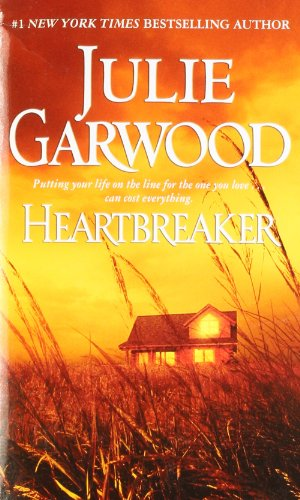

In [54]:
# Filtrando o link da capa do Harry Potter
Link = Tab_Cruzada.loc[Tab_Cruzada['Titulo'] == "Heartbreaker"].head(1)[
    'Image-URL-L'].values[0]

# Buscar as informações
Imagem = getImage(Link)

Imagem

In [55]:
# Lista para receber os links das Recomendações
Lista_URL = []
# Loop nas Recomendações
for Loop in range(len(Recomendacao)):
    # Filtro na Matriz
    Selecao_Loop = Matriz.index[Recomendacao[Loop]]

    # Atribuindo a lista
    Lista_URL = Selecao_Loop
    # Filtrando o link das recomendações
    Link_Recomendacao_01 = Tab_Cruzada.loc[Tab_Cruzada['Titulo'] == Lista_URL[1]].head(1)[
        'Image-URL-L'].values[0]
    Link_Recomendacao_02 = Tab_Cruzada.loc[Tab_Cruzada['Titulo'] == Lista_URL[2]].head(1)[
        'Image-URL-L'].values[0]
    Link_Recomendacao_03 = Tab_Cruzada.loc[Tab_Cruzada['Titulo'] == Lista_URL[3]].head(1)[
        'Image-URL-L'].values[0]
    Link_Recomendacao_04 = Tab_Cruzada.loc[Tab_Cruzada['Titulo'] == Lista_URL[4]].head(1)[
        'Image-URL-L'].values[0]

In [56]:
# Atribuindo imagens
Imagem_01 = getImage(Link_Recomendacao_01)
Imagem_02 = getImage(Link_Recomendacao_02)
Imagem_03 = getImage(Link_Recomendacao_03)
Imagem_04 = getImage(Link_Recomendacao_04)

In [57]:
# Construir Relatório
Titulos = ['Seleção', 'Recomendação 1',
           'Recomendação 2', 'Recomendação 3', 'Recomendação 4']

# Criando a Figura
Figura = make_subplots(
    rows=1,
    cols=5,
    subplot_titles=Titulos
)

# Ajustando o layout
Figura.update_layout(
    height=500,
    width=1200,
    title_text='Sistema de Recomendação',
    showlegend=False
)

# Imagem da Seleção
Figura.add_trace(
    Go.Image(
        z=Imagem,
    ),
    row=1, col=1
)
# Imagem da Recomendação 1
Figura.add_trace(
    Go.Image(
        z=Imagem_01,
    ),
    row=1, col=2
)
# Imagem da Recomendação 2
Figura.add_trace(
    Go.Image(
        z=Imagem_02,
    ),
    row=1, col=3
)
# Imagem da Recomendação 3
Figura.add_trace(
    Go.Image(
        z=Imagem_03,
    ),
    row=1, col=4
)
# Imagem da Recomendação 4
Figura.add_trace(
    Go.Image(
        z=Imagem_04,
    ),
    row=1, col=5
)
# Imagem da Seleção
Figura.add_trace(
    Go.Image(
        z=Imagem,
    ),
    row=1, col=1
)
# Mostrar
Figura.show()